In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import os
from scipy.integrate import solve_ivp

INSTRUMENT INITIALIZATION

In [4]:
user = os.getlogin()

# FOLDER PATH
path = f'/home/{user}/CeNN/Assimilation_Radiance/'
canais = [6,7,8,9,10,11,12,13,14] # Number_channels
sat = "N19" # Satellite
sensor = "AMSUA" # Sensor
gdhs = ["2023020100"]


RADIANCE DATA ASSIMILATINO BY CELLULAR NEURAL NETWORK 

In [ ]:
for gdh in gdhs:
    for canal in canais:
        print(f'round to the channel {canal}')

        # LOADING SIMULATION AND OBSERVATION FILES 
        arq_fg = np.loadtxt(f'{path}/{sat}/{sensor}/{gdh}/ges_ch_{canal}')
        arq_obs = np.loadtxt(f'{path}/{sat}/{sensor}/{gdh}/obs_ch_{canal}')
        mat_x = (np.array(arq_fg))
        mat_y = (np.array(arq_obs))

        # FEEDBACK TEMPLATE('AY')
        feedback_template = [0.1,0.1,0.2,0.1,0.1]

        # VECTOR SIZE
        height_i = len(mat_x)

        # INPUTS [Bias, Epochs (EPC*k) and Initial Condition]
        Bias = 0
        EPC = 25
        CI = 1

        # VECTOR OPENING
        L1=[]
        l1=[]
        L2=[]
        l2=[]
        L3=[]
        l3=[]
        X=[]
        DX=[]
        linha_x=[]
        linha_dx=[]
        A=[]
        B=[]
        lista_DV = []
        Cont = []
        Cost = [0]
        # DERIVATIVE FUCTION
        funcao_deriv = lambda a, b, x, y, w, z: -x + y + w + z

        #LOOPING PASSING THROUGH EACH CELL IN 'T' ITERATIONS
        for k in range(0,2,1):
            # DEFINITION OF 'U' AND 'z0'
            U = mat_x
            z0 = mat_x * CI
            for t in (range(0,EPC,1)):
                print("Iteration:", t)
                for i in range(0,height_i, 1):
                    # DEFINIÇÃO DAS CONDIÇÕES P/ BORDAS DA IMAGEM
                    if i==0:
                    # DEFINITION OF CONDITIONS FOR THE FIRST SENSOR CELLS
                        x1 = 0
                        x2 = 0
                        x3 = U[i]
                        x4 = U[i+1]
                        x5 = U[i+2]
                        obs1 = 0
                        obs2 = 0
                        obs3 = mat_y[i]
                        obs4 = mat_y[i+1]
                        obs5 = mat_y[i+2]
                    elif i==1:
                    # DEFINITION OF CONDITIONS FOR THE FIRST SENSOR CELLS
                        x1 = 0
                        x2 = U[i-1]
                        x3 = U[i]
                        x4 = U[i+1]
                        x5 = U[i+2]
                        obs1 = 0
                        obs2 = mat_y[i-1]
                        obs3 = mat_y[i]
                        obs4 = mat_y[i+1]
                        obs5 = mat_y[i+2]
                    elif i==height_i-2:
                    # DEFINITION OF CONDITIONS FOR THE LAST SENSOR CELLS
                        x1 = U[i-2]
                        x2 = U[i-1]
                        x3 = U[i]
                        x4 = U[i+1]
                        x5 = 0
                        obs1 = mat_y[i-2]
                        obs2 = mat_y[i-1]
                        obs3 = mat_y[i]
                        obs4 = mat_y[i+1]
                        obs5 = 0
                    elif i==height_i-1:
                    # DEFINITION OF CONDITIONS FOR THE LAST SENSOR CELLS
                        x1 = U[i-2]
                        x2 = U[i-1]
                        x3 = U[i]
                        x4 = 0
                        x5 = 0
                        obs1 = mat_y[i-2]
                        obs2 = mat_y[i-1]
                        obs3 = mat_y[i]
                        obs4 = 0
                        obs5 = 0
                    else:
                        x1 = U[i-2]
                        x2 = U[i-1]
                        x3 = U[i]
                        x4 = U[i+1]
                        x5 = U[i+2]
                        obs1 = mat_y[i-2]
                        obs2 = mat_y[i-1]
                        obs3 = mat_y[i]
                        obs4 = mat_y[i+1]
                        obs5 = mat_y[i+2]
                    if i==0:
                        # DEFINITION OF THE CONTROL TEMPLATE FOR THE FIRST SENSOR CELLS AND DEFINITION OF CONDITIONS FOR THE FIRST SENSOR CELLS
                        control_template = [0, 0, (mat_y[i]/z0[i])/3, (mat_y[i]/z0[i+1])/3, (mat_y[i]/z0[i+2])/3]
                        z1 = 0
                        z2 = 0
                        z3 = z0[i]  
                        z4 = z0[i+1]
                        z5 = z0[i+2]
                    elif i==1:
                        # DEFINITION OF THE CONTROL TEMPLATE FOR THE FIRST SENSOR CELLS AND DEFINITION OF CONDITIONS FOR THE FIRST SENSOR CELLS
                        control_template = [0, (mat_y[i]/z0[i-1])/4, (mat_y[i]/z0[i])/4, (mat_y[i]/z0[i+1])/4, (mat_y[i]/z0[i+2])/4]
                        z1 = 0
                        z2 = z0[i-1]
                        z3 = z0[i]
                        z4 = z0[i+1]
                        z5 = z0[i+2]
                    elif i==height_i-2:
                        # DEFINITION OF THE CONTROL TEMPLATE FOR THE LAST SENSOR CELLS AND DEFINITION OF CONDITIONS FOR THE LAST SENSOR CELLS
                        control_template = [(mat_y[i]/z0[i-2])/4, (mat_y[i]/z0[i-1])/4, (mat_y[i]/z0[i])/4, (mat_y[i]/z0[i+1])/4, 0]
                        z1 = z0[i-2]
                        z2 = z0[i-1]
                        z3 = z0[i]
                        z4 = z0[i+1]
                        z5 = 0
                    elif i==height_i-1:
                        # DEFINITION OF THE CONTROL TEMPLATE FOR THE LAST SENSOR CELLS AND DEFINITION OF CONDITIONS FOR THE LAST SENSOR CELLS
                        control_template = [(mat_y[i]/z0[i-2])/3, (mat_y[i]/z0[i-1])/3, (mat_y[i]/z0[i])/3, 0, 0]
                        z1 = z0[i-2]
                        z2 = z0[i-1]
                        z3 = z0[i]
                        z4 = 0
                        z5 = 0
                    else:
                        # GENERAL CONDITION OF THE CONTROL TEMPLATE DEFINITION
                        control_template = [(mat_y[i]/z0[i-2])/5, (mat_y[i]/z0[i-1])/5, (mat_y[i]/z0[i])/5, (mat_y[i]/z0[i+1])/5, (mat_y[i]/z0[i+2])/5]
                        z1 = z0[i-2]
                        z2 = z0[i-1]
                        z3 = z0[i]
                        z4 = z0[i+1]
                        z5 = z0[i+2]

                    # SATURATION/ACTIVATION FUNCTION FOR 'AY'
                    y1= -0.5 * (abs((z1 - obs1) + 1) - abs((z1 - obs1) - 1))
                    y2= -0.5 * (abs((z2 - obs2) + 1) - abs((z2 - obs2) - 1))
                    y3= -0.5 * (abs((z3 - obs3) + 1) - abs((z3 - obs3) - 1))
                    y4= -0.5 * (abs((z4 - obs4) + 1) - abs((z4 - obs4) - 1))
                    y5= -0.5 * (abs((z5 - obs5) + 1) - abs((z5 - obs5) - 1))

                    # CONSTRUCTION OF NEIGHBORHOOD VECTORS
                    A.append(y1)
                    A.append(y2)
                    A.append(y3)
                    A.append(y4)
                    A.append(y5)
                    B.append(x1)
                    B.append(x2)
                    B.append(x3)
                    B.append(x4)
                    B.append(x5)

                    # 'AY' AND 'BU' DEFINITION
                    Ay = A[0]*feedback_template[0] + A[1]*feedback_template[1] + A[2]*feedback_template[2] + A[3]*feedback_template[3] + A[4]*feedback_template[4]
                    Bu = B[0]*control_template[0] + B[1]*control_template[1] + B[2]*control_template[2] + B[3]*control_template[3] + B[4]*control_template[4]

                    # CELL DERIVATIVE CALCULATION
                    x_deriv = funcao_deriv(0,0,z3,Bias,Ay, Bu)

                    # CELL INTEGRAL CALCULATION
                    x_integ = solve_ivp(funcao_deriv, [0,2], [z3], args=(z3,Bias,Ay, Bu), method='RK45')

                    # UPDATED CELL            
                    x_novo = float(x_integ.y[0][1])
                    z0[i]=x_novo
                    A=[]
                    B=[]

                # CHECKING STOPPING CRITERIA. IF YOU ARE NOT OBEYING THE CONDITION, GO BACK FOR ANOTHER LOOP SEASON.
                Cont = []
                sum_a = 0

                for i in range(len(z0)):
                    cost_a = (mat_y[i] - z0[i])**2
                    sum_a = cost_a + sum_a

                Cost.append(sum_a.round(2))

                if Cost[t] == (Cost[t-1]) and t > 5:
                    break
                
                X = []
                DX = []
            mat_x = z0
        # ANALYSIS WITH CeNN
        np.savetxt(f'{path}/{sat}/{sensor}/{gdh}/cnn_ch_{canal}',z0,fmt='%s')

PLOT DIFFERENCE (OMF AND OMA)

/tmp/ipykernel_7461/4208106060.py:20: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
/tmp/ipykernel_7461/4208106060.py:34: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  plt.xlabel(f"Longitude \n Nobs={len(z)} Avg={float((np.mean(g)).round(3))} Std ={float((np.std(g)).round(3))}")
/tmp/ipykernel_7461/4208106060.py:50: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  plt.xlabel(f"Longitude \n Nobs={len(z)} Avg={float((np.mean(c)).round(3))} Std ={float((np.std(c)).round(3))}")
/tmp/ipykernel_7461/4208106060.py:66: FutureWarning: Calling float on a single 

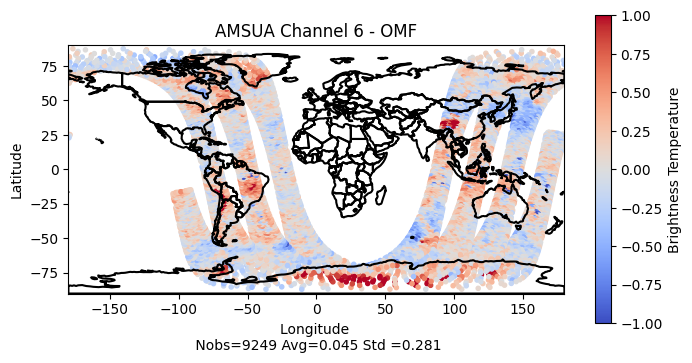

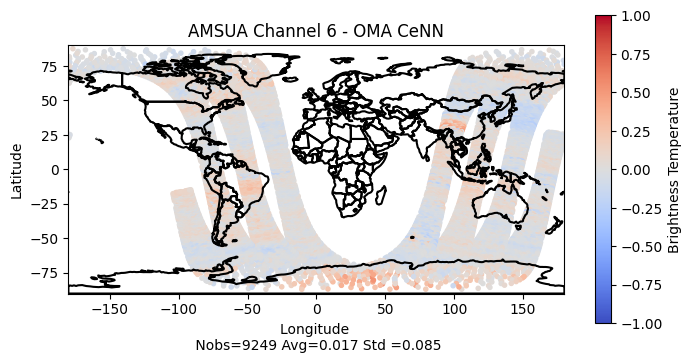

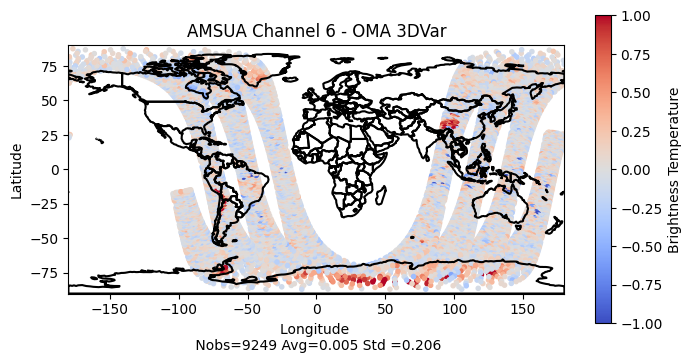

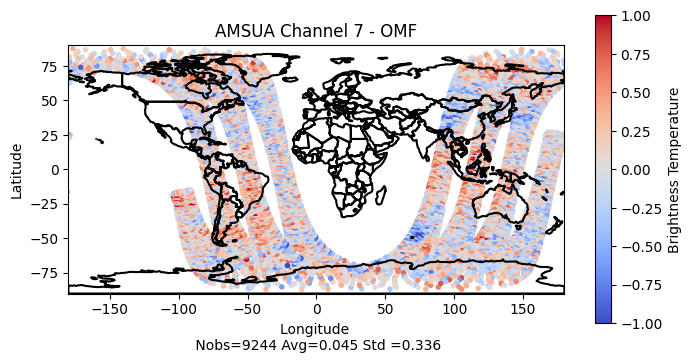

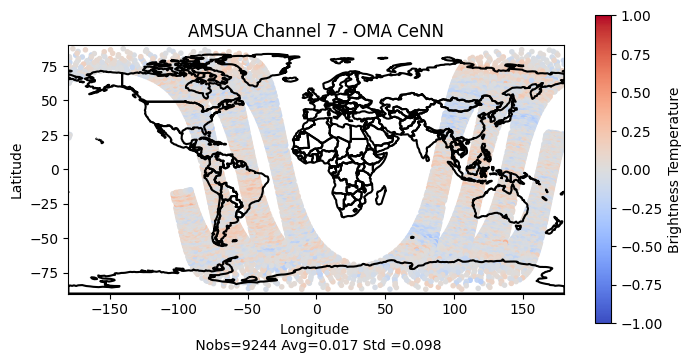

...

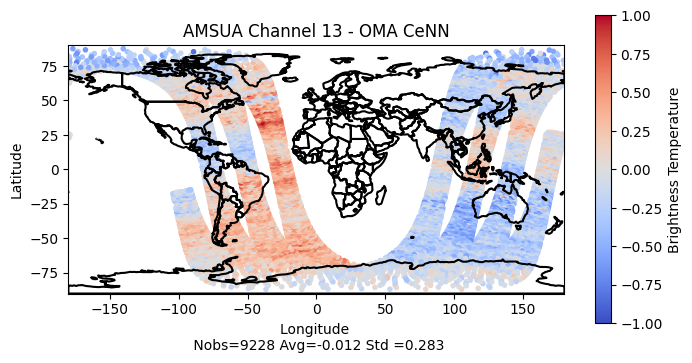

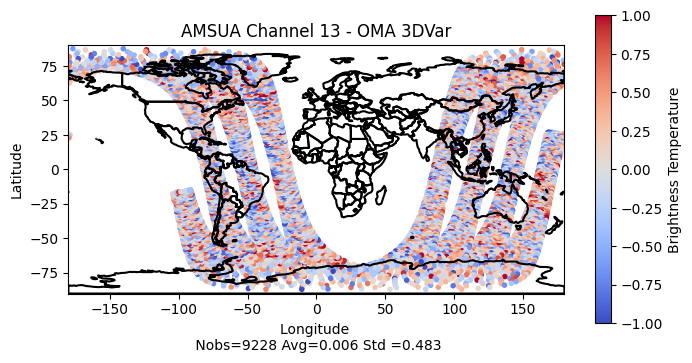

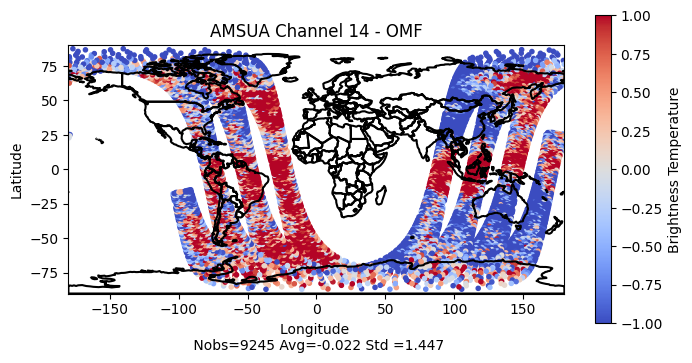

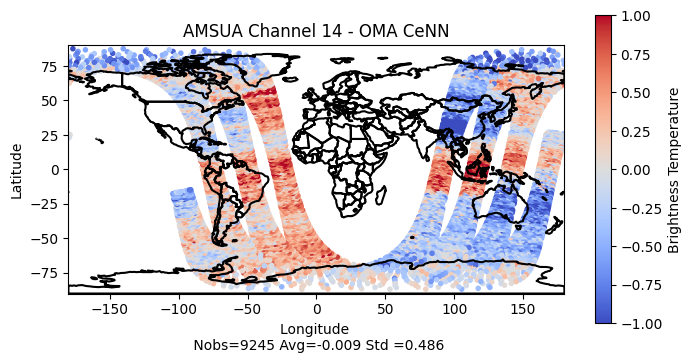

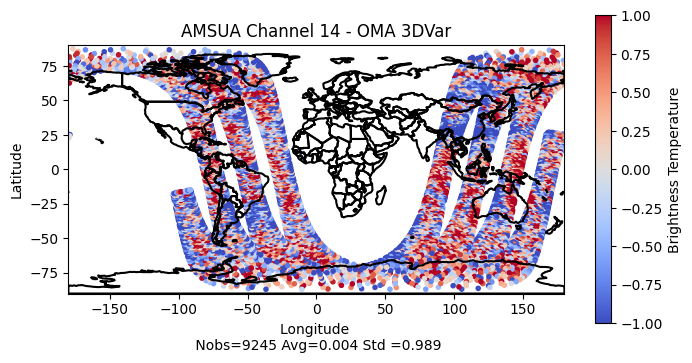

In [8]:
for gdh in gdhs:
    for canal in canais:
    
        Lat = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/lat_ch_{canal}',sep=",", header=None)
        Lon = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/lon_ch_{canal}',sep=",", header=None)
        
        Cnn = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/cnn_ch_{canal}',sep=",", header=None)
        Obs = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/obs_ch_{canal}',sep=",", header=None)
        Ges = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/ges_ch_{canal}',sep=",", header=None)
        Anl = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/anl_ch_{canal}',sep=",", header=None)
    
        a = Obs - Anl
        c = Obs - Cnn
        g = Obs - Ges 
    
        max = 1
        min = -1
    
        # WORLD MAP DATA
        worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
    
        ### FIRST GUESS
    
        fig, ax = plt.subplots(figsize=(8, 4))
        x = Lon
        y = Lat
        z = g
        plt.scatter(x, y, c=z, alpha=1, marker='.', vmin=min, vmax=max,cmap='coolwarm')
        plt.colorbar(label='Brightness Temperature')
        plt.xlim([-180,180])
        plt.ylim([-90, 90])
        worldmap.boundary.plot(color="black", ax=ax)
        plt.title(f"AMSUA Channel {canal} - OMF")
        plt.xlabel(f"Longitude \n Nobs={len(z)} Avg={float((np.mean(g)).round(3))} Std ={float((np.std(g)).round(3))}")
        plt.ylabel("Latitude")
        plt.savefig(f'{path}/{sat}/{sensor}/{gdh}/Figuras/Diff/ch_{canal}_diff_ges.png', format='png')
    
        ### CELLULAR NEURAL NETWORK
    
        fig, ax = plt.subplots(figsize=(8, 4))
        x = Lon
        y = Lat
        z = c
        plt.scatter(x, y, c=z, alpha=1, marker='.', vmin=min, vmax=max,cmap='coolwarm')
        plt.colorbar(label='Brightness Temperature')
        plt.xlim([-180, 180])
        plt.ylim([-90, 90])
        worldmap.boundary.plot(color="black", ax=ax)
        plt.title(f"AMSUA Channel {canal} - OMA CeNN")
        plt.xlabel(f"Longitude \n Nobs={len(z)} Avg={float((np.mean(c)).round(3))} Std ={float((np.std(c)).round(3))}")    
        plt.ylabel("Latitude")
        plt.savefig(f'{path}/{sat}/{sensor}/{gdh}/Figuras/Diff/ch_{canal}_diff_cnn.png', format='png')
    
        ### ANALYSIS
    
        fig, ax = plt.subplots(figsize=(8, 4))
        x = Lon
        y = Lat
        z = a
        plt.scatter(x, y, c=z, alpha=1, marker='.', vmin=min, vmax=max,cmap='coolwarm')
        plt.colorbar(label='Brightness Temperature')
        plt.xlim([-180, 180])
        plt.ylim([-90, 90])
        worldmap.boundary.plot(color="black", ax=ax)
        plt.title(f"AMSUA Channel {canal} - OMA 3DVar")
        plt.xlabel(f"Longitude \n Nobs={len(z)} Avg={float((np.mean(a)).round(3))} Std ={float((np.std(a)).round(3))}")    
        plt.ylabel("Latitude")
        plt.savefig(f'{path}/{sat}/{sensor}/{gdh}/Figuras/Diff/ch_{canal}_diff_anl.png', format='png')

PLOT RADIANCE DATA (OBSERVATION, FIRST GUESS AND ANALYSIS)

/tmp/ipykernel_7461/3906710980.py:23: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
/tmp/ipykernel_7461/3906710980.py:23: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
/tmp/ipykernel_7461/3906710980.py:23: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
/tmp/ip

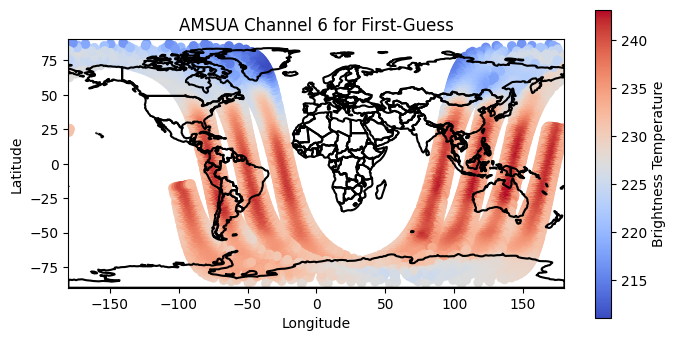

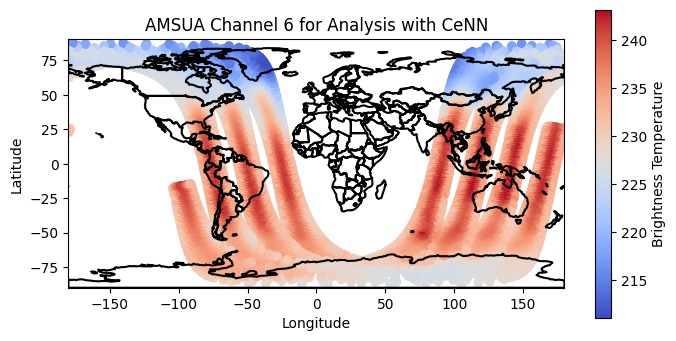

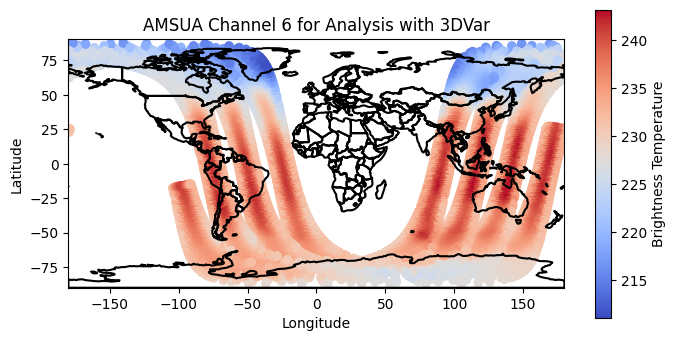

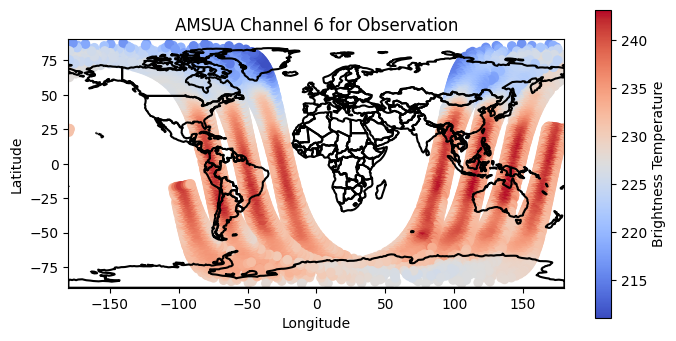

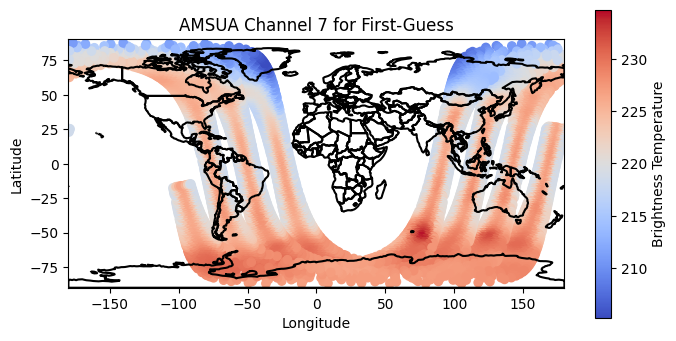

...

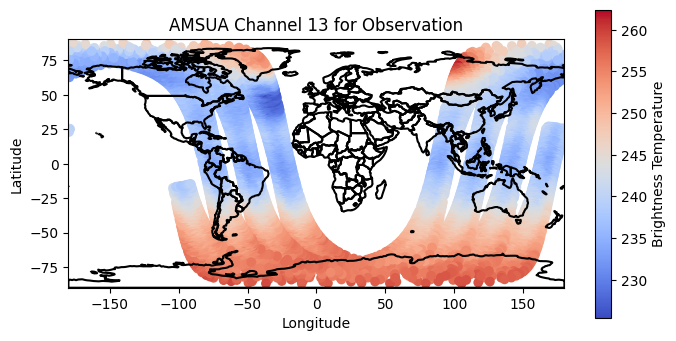

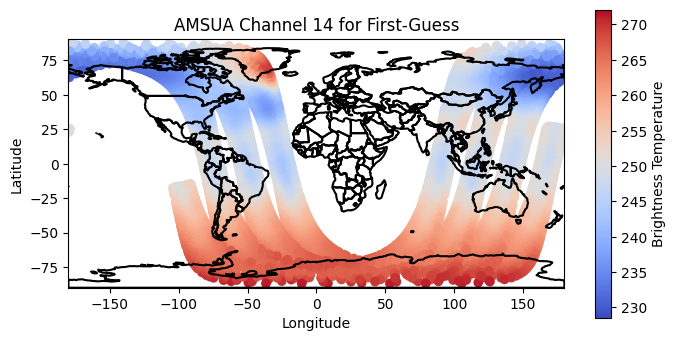

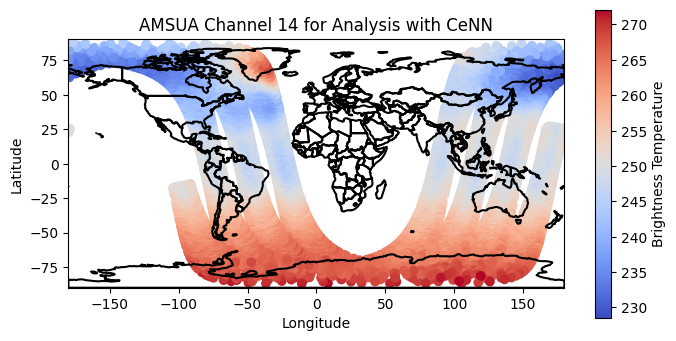

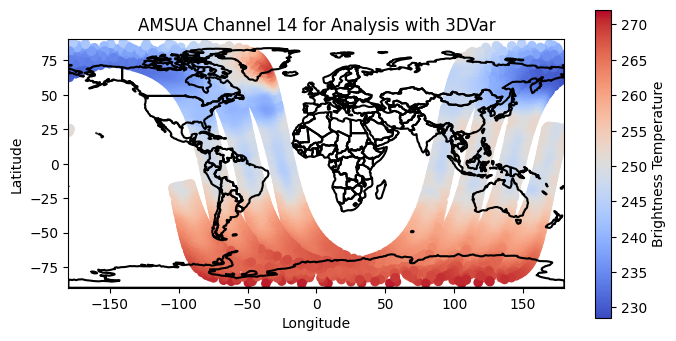

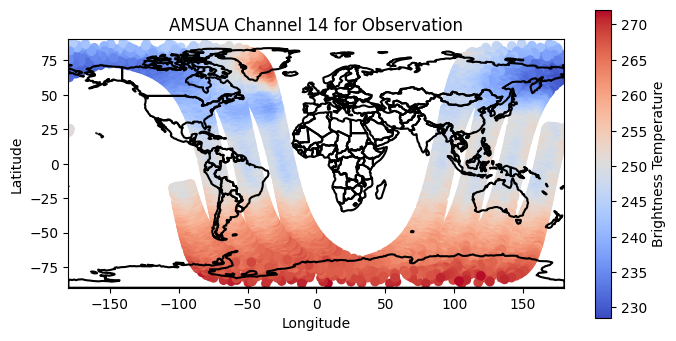

In [7]:
for gdh in gdhs:
    for canal in canais:
    
        Lat = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/lat_ch_{canal}',sep=",", header=None)
        Lon = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/lon_ch_{canal}',sep=",", header=None)
        
        Cnn = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/cnn_ch_{canal}',sep=",", header=None)
        Obs = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/obs_ch_{canal}',sep=",", header=None)
        Ges = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/ges_ch_{canal}',sep=",", header=None)
        Anl = pd.read_csv(f'{path}/{sat}/{sensor}/{gdh}/anl_ch_{canal}',sep=",", header=None)
    
        MM = np.array([Cnn,Obs,Ges,Anl])
    
        max = MM.max()
        min = MM.min()
    
        a = Anl
        c = Cnn
        g = Ges 
        o = Obs
    
        # From GeoPandas, our world map data
        worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
    
        ### FIRST GUESS
    
        fig, ax = plt.subplots(figsize=(8, 4))
        x = Lon
        y = Lat
        z = g
        plt.scatter(x, y, c=z, alpha=1, vmin=min, vmax=max,cmap='coolwarm')
        plt.colorbar(label='Brightness Temperature')
        plt.xlim([-180, 180])
        plt.ylim([-90, 90])
        worldmap.boundary.plot(color="black", ax=ax)
        plt.title(f"AMSUA Channel {canal} for First-Guess")
        plt.xlabel("Longitude")
        plt.ylabel("Latitude")
        plt.savefig(f'{path}/{sat}/{sensor}/{gdh}/Figuras/Temp/ch_{canal}_fg.png', format='png')
    
        ### CELLULAR NEURAL NETWORK
    
        fig, ax = plt.subplots(figsize=(8, 4))
        x = Lon
        y = Lat
        z = c
        plt.scatter(x, y, c=z, alpha=1, vmin=min, vmax=max,cmap='coolwarm')
        plt.colorbar(label='Brightness Temperature')
        plt.xlim([-180, 180])
        plt.ylim([-90, 90])
        worldmap.boundary.plot(color="black", ax=ax)
        plt.title(f"AMSUA Channel {canal} for Analysis with CeNN")
        plt.xlabel("Longitude")
        plt.ylabel("Latitude")
        plt.savefig(f'{path}/{sat}/{sensor}/{gdh}/Figuras/Temp/ch_{canal}_cnn.png', format='png')
    
        ### ANALYSIS
    
        fig, ax = plt.subplots(figsize=(8, 4))
        x = Lon
        y = Lat
        z = a
        plt.scatter(x, y, c=z, alpha=1, vmin=min, vmax=max,cmap='coolwarm')
        plt.colorbar(label='Brightness Temperature')
        plt.xlim([-180, 180])
        plt.ylim([-90, 90])
        worldmap.boundary.plot(color="black", ax=ax)
        plt.title(f"AMSUA Channel {canal} for Analysis with 3DVar")
        plt.xlabel("Longitude")
        plt.ylabel("Latitude")
        plt.savefig(f'{path}/{sat}/{sensor}/{gdh}/Figuras/Temp/ch_{canal}_anl.png', format='png')
    
        ### OBSERVATION
    
        fig, ax = plt.subplots(figsize=(8, 4))
        x = Lon
        y = Lat
        z = o
        plt.scatter(x, y, c=z, alpha=1, vmin=min, vmax=max,cmap='coolwarm')
        plt.colorbar(label='Brightness Temperature')
        plt.xlim([-180, 180])
        plt.ylim([-90, 90])
        worldmap.boundary.plot(color="black", ax=ax)
        plt.title(f"AMSUA Channel {canal} for Observation")
        plt.xlabel("Longitude")
        plt.ylabel("Latitude")
        plt.savefig(f'{path}/{sat}/{sensor}/{gdh}/Figuras/Temp/ch_{canal}_obs.png', format='png')